In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/craigslist-carstrucks-data/vehicles.csv


In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [3]:
df = pd.read_csv('/kaggle/input/craigslist-carstrucks-data/vehicles.csv')

In [4]:
df.head()

,id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,...,size,type,paint_color,image_url,description,county,state,lat,long,posting_date
0,7222695916,https://prescott.craigslist.org/cto/d/prescott...,prescott,https://prescott.craigslist.org,6000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,az,NaN,NaN,NaN
1,7218891961,https://fayar.craigslist.org/ctd/d/bentonville...,fayetteville,https://fayar.craigslist.org,11900,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,ar,NaN,NaN,NaN
2,7221797935,https://keys.craigslist.org/cto/d/summerland-k...,florida keys,https://keys.craigslist.org,21000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,fl,NaN,NaN,NaN
3,7222270760,https://worcester.craigslist.org/cto/d/west-br...,worcester / central MA,https://worcester.craigslist.org,1500,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,ma,NaN,NaN,NaN
4,7210384030,https://greensboro.craigslist.org/cto/d/trinit...,greensboro,https://greensboro.craigslist.org,4900,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,nc,NaN,NaN,NaN


In [5]:
df.columns

Index(['id', 'url', 'region', 'region_url', 'price', 'year', 'manufacturer',
       'model', 'condition', 'cylinders', 'fuel', 'odometer', 'title_status',
       'transmission', 'VIN', 'drive', 'size', 'type', 'paint_color',
       'image_url', 'description', 'county', 'state', 'lat', 'long',
       'posting_date'],
      dtype='object')

In [6]:
df.describe()

,id,price,year,odometer,county,lat,long
count,4.268800e+05,4.268800e+05,425675.000000,4.224800e+05,0.0,420331.000000,420331.000000
mean,7.311487e+09,7.519903e+04,2011.235191,9.804333e+04,NaN,38.493940,-94.748599
std,4.473170e+06,1.218228e+07,9.452120,2.138815e+05,NaN,5.841533,18.365462
min,7.207408e+09,0.000000e+00,1900.000000,0.000000e+00,NaN,-84.122245,-159.827728
25%,7.308143e+09,5.900000e+03,2008.000000,3.770400e+04,NaN,34.601900,-111.939847
50%,7.312621e+09,1.395000e+04,2013.000000,8.554800e+04,NaN,39.150100,-88.432600
75%,7.315254e+09,2.648575e+04,2017.000000,1.335425e+05,NaN,42.398900,-80.832039
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07,NaN,82.390818,173.885502


In [7]:
# Number of null values in each column
df.isna().sum()

id                   0
url                  0
region               0
region_url           0
price                0
year              1205
manufacturer     17646
model             5277
condition       174104
cylinders       177678
fuel              3013
odometer          4400
title_status      8242
transmission      2556
VIN             161042
drive           130567
size            306361
type             92858
paint_color     130203
image_url           68
description         70
county          426880
state                0
lat               6549
long              6549
posting_date        68
dtype: int64

In [8]:
df.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
426875    False
426876    False
426877    False
426878    False
426879    False
Length: 426880, dtype: bool

In [9]:
# Number of null values in each column
df.isna().sum()

id                   0
url                  0
region               0
region_url           0
price                0
year              1205
manufacturer     17646
model             5277
condition       174104
cylinders       177678
fuel              3013
odometer          4400
title_status      8242
transmission      2556
VIN             161042
drive           130567
size            306361
type             92858
paint_color     130203
image_url           68
description         70
county          426880
state                0
lat               6549
long              6549
posting_date        68
dtype: int64

In [10]:
df.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
426875    False
426876    False
426877    False
426878    False
426879    False
Length: 426880, dtype: bool

In [11]:
df.drop_duplicates()

,id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,...,size,type,paint_color,image_url,description,county,state,lat,long,posting_date
0,7222695916,https://prescott.craigslist.org/cto/d/prescott...,prescott,https://prescott.craigslist.org,6000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,az,NaN,NaN,NaN
1,7218891961,https://fayar.craigslist.org/ctd/d/bentonville...,fayetteville,https://fayar.craigslist.org,11900,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,ar,NaN,NaN,NaN
2,7221797935,https://keys.craigslist.org/cto/d/summerland-k...,florida keys,https://keys.craigslist.org,21000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,fl,NaN,NaN,NaN
3,7222270760,https://worcester.craigslist.org/cto/d/west-br...,worcester / central MA,https://worcester.craigslist.org,1500,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,ma,NaN,NaN,NaN
4,7210384030,https://greensboro.craigslist.org/cto/d/trinit...,greensboro,https://greensboro.craigslist.org,4900,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,nc,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426875,7301591192,https://wyoming.craigslist.org/ctd/d/atlanta-2...,wyoming,https://wyoming.craigslist.org,23590,2019.0,nissan,maxima s sedan 4d,good,6 cylinders,...,NaN,sedan,NaN,https://images.craigslist.org/00o0o_iiraFnHg8q...,Carvana is the safer way to buy a car During t...,NaN,wy,33.786500,-84.445400,2021-04-04T03:21:31-0600
426876,7301591187,https://wyoming.craigslist.org/ctd/d/atlanta-2...,wyoming,https://wyoming.craigslist.org,30590,2020.0,volvo,s60 t5 momentum sedan 4d,good,NaN,...,NaN,sedan,red,https://images.craigslist.org/00x0x_15sbgnxCIS...,Carvana is the safer way to buy a car During t...,NaN,wy,33.786500,-84.445400,2021-04-04T03:21:29-0600
426877,7301591147,https://wyoming.craigslist.org/ctd/d/atlanta-2...,wyoming,https://wyoming.craigslist.org,34990,2020.0,cadillac,xt4 sport suv 4d,good,NaN,...,NaN,hatchback,white,https://images.craigslist.org/00L0L_farM7bxnxR...,Carvana is the safer way to buy a car During t...,NaN,wy,33.779214,-84.411811,2021-04-04T03:21:17-0600
426878,7301591140,https://wyoming.craigslist.org/ctd/d/atlanta-2...,wyoming,https://wyoming.craigslist.org,28990,2018.0,lexus,es 350 sedan 4d,good,6 cylinders,...,NaN,sedan,silver,https://images.craigslist.org/00z0z_bKnIVGLkDT...,Carvana is the safer way to buy a car During t...,NaN,wy,33.786500,-84.445400,2021-04-04T03:21:11-0600


Text(0.5, -0.25, 'Fig: Heatmap to visualize the numeber of null values presence in each column')

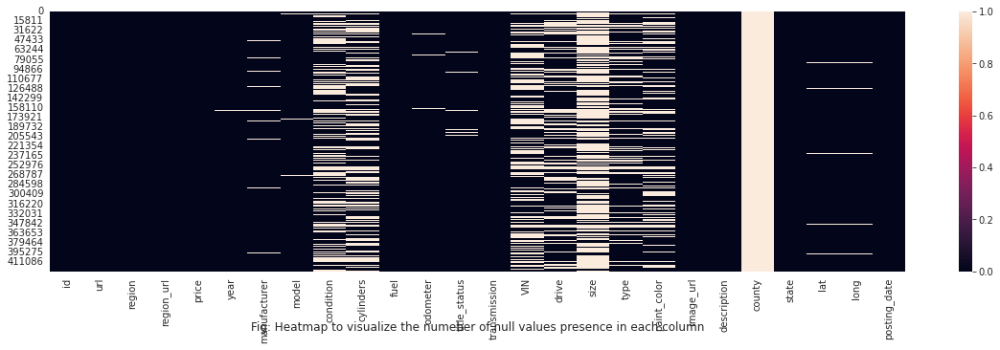

In [12]:
plt.figure(figsize = (20, 5))
sns.set_style("darkgrid")
sns.heatmap(df.isnull())
plt.title('Fig: Heatmap to visualize the numeber of null values presence in each column', y=-0.25)

In [13]:
# Dropping the unnecessary columns

df.drop(['region_url','image_url','description','county'],inplace=True,axis=1)

In [14]:
df['condition'].replace(to_replace=np.nan,value='Not Provided',inplace=True)

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, -0.23, 'Fig: Number of cars of each condition')

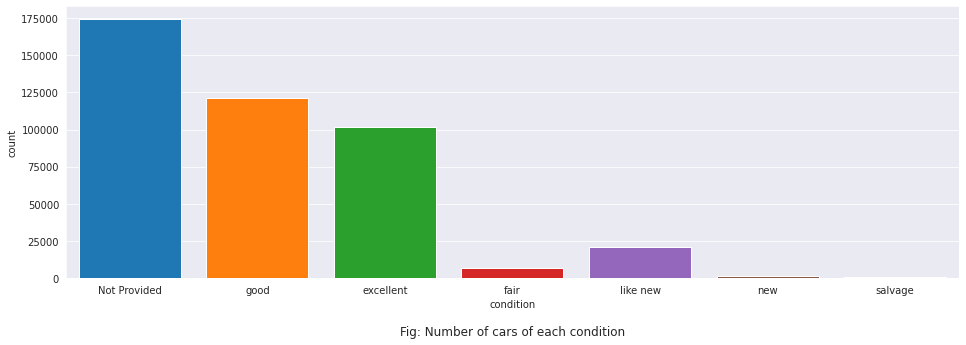

In [15]:
plt.figure(figsize = (16, 5))
sns.countplot(df['condition'],saturation=5)
plt.title('Fig: Number of cars of each condition', y=-0.23)

In [16]:
# Sorting the order of regions from which cars listed

df['region'].value_counts().sort_values(ascending=False).head()

columbus                   3608
jacksonville               3562
spokane / coeur d'alene    2988
eugene                     2985
fresno / madera            2983
Name: region, dtype: int64

In [17]:
df[df['manufacturer']=='mercedes-benz']['region'].value_counts().sort_values(ascending=False).head(1)

new york city    213
Name: region, dtype: int64

In [18]:
# Replacing the values of cylinders with corresponding numerical digits

df['cylinders'].replace(to_replace=['3 cylinders','4 cylinders','5 cylinders','6 cylinders','8 cylinders','10 cylinders','12 cylinders'
,'other'],value=[3,4,5,6,8,10,12,np.nan],inplace=True)

In [19]:
# Replacing the values of cylinders with corresponding numerical digits

df['cylinders'].replace(to_replace=['3 cylinders','4 cylinders','5 cylinders','6 cylinders','8 cylinders','10 cylinders','12 cylinders'
,'other'],value=[3,4,5,6,8,10,12,np.nan],inplace=True)

In [20]:
df['cylinders'].isnull().sum()

178976

In [21]:
# Number of cars under each cylinder types 

df['cylinders'].value_counts().sort_values()

12.0      209
3.0       655
10.0     1455
5.0      1712
8.0     72062
4.0     77642
6.0     94169
Name: cylinders, dtype: int64

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, -0.23, 'Fig: Price distribution of 3 cylinder cars')

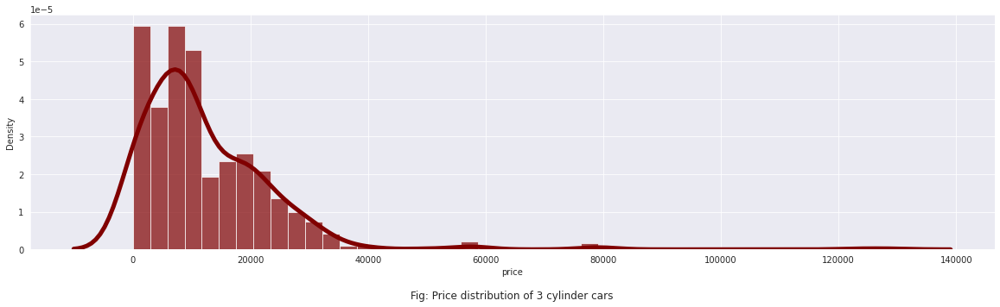

In [22]:
plt.figure(figsize = (20, 5))
sns.distplot(df[df['cylinders']==3]['price'],color='maroon',hist_kws={'alpha':0.7},kde_kws={'lw':5})
plt.title('Fig: Price distribution of 3 cylinder cars', y=-0.23)

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, -0.23, 'Fig: Price distribution of 5 cylinder cars')

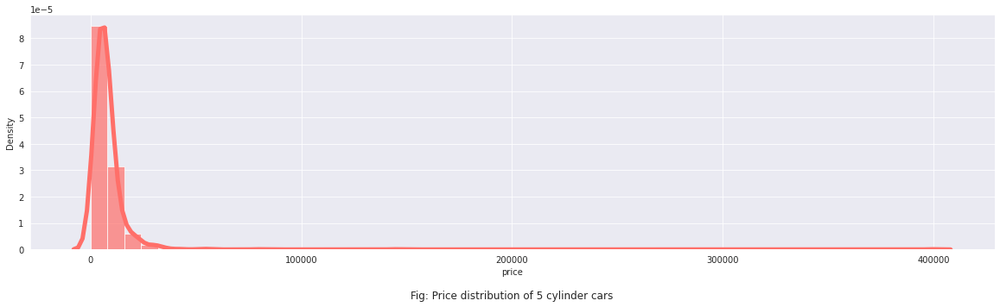

In [23]:
plt.figure(figsize = (20, 5))
sns.distplot(df[df['cylinders']==5]['price'],hist_kws={'alpha':0.7},color='#ff6f69',kde_kws={'lw':5})
plt.title('Fig: Price distribution of 5 cylinder cars', y=-0.23)

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, -0.23, 'Fig: Price distribution of 10 cylinder cars')

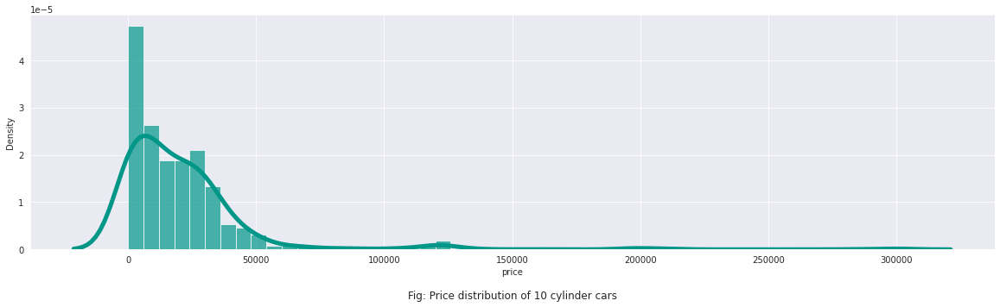

In [24]:
plt.figure(figsize = (20, 5))
sns.distplot(df[df['cylinders']==10]['price'],hist_kws={'alpha':0.7},color='#009688',kde_kws={'lw':5})
plt.title('Fig: Price distribution of 10 cylinder cars', y=-0.23)

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, -0.23, 'Fig: Price distribution of 12 cylinder cars')

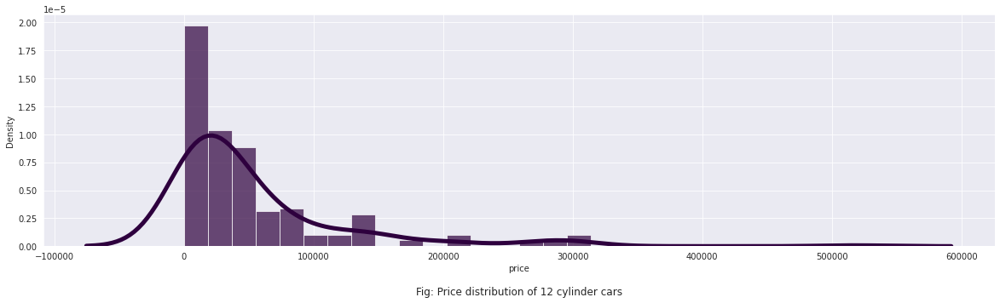

In [25]:
plt.figure(figsize = (20, 5))
sns.distplot(df[df['cylinders']==12]['price'],hist_kws={'alpha':0.7},color='#2e003e',kde_kws={'lw':5})
plt.title('Fig: Price distribution of 12 cylinder cars', y=-0.23)

In [26]:
# Correlation coefficient of price and cylinders 

df['cylinders'].corr(df['price'])

0.0038776222602333816

Text(0.5, -0.23, 'Fig: Annoted values of correlation coefficient of each pair of numerical values')

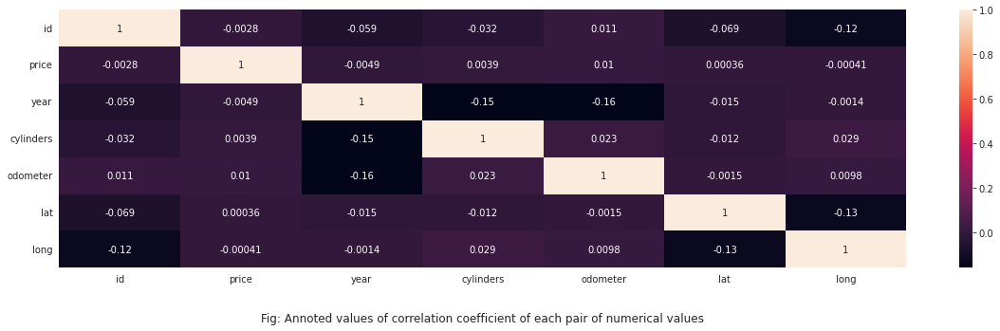

In [27]:
plt.figure(figsize = (20, 5))
sns.heatmap(df.corr(),annot=True)
plt.title('Fig: Annoted values of correlation coefficient of each pair of numerical values', y=-0.23)

In [28]:
#Maximum price of each distinct car model

df.groupby('model').max()['price'].sort_values(ascending=False)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  This is separate from the ipykernel package so we can avoid doing imports until


model
4runner                     3736928711
tundra                      3736928711
benz e320                   3024942282
benz s430                   3024942282
wrangler                    1410065407
                               ...    
soul 5dr wgn man +                   0
rav4 le fwd                          0
1500 regular cab manual,             0
INTERNATIONAL 4390                   0
rav4 3rd row                         0
Name: price, Length: 29667, dtype: int64

In [29]:
df[df['model']=='4runner']['manufacturer']

348       toyota
1188      toyota
1623      toyota
2883      toyota
2904      toyota
           ...  
423491    toyota
425492    toyota
426270    toyota
426453    toyota
426689    toyota
Name: manufacturer, Length: 1073, dtype: object

In [30]:
# Average price of the cars of corresponding manufacturer

df.groupby('manufacturer').mean()['price'].sort_values(ascending=False)

manufacturer
mercedes-benz      531710.557333
volvo              383755.147896
toyota             234294.682621
jeep               150717.819659
chevrolet          115676.101645
ferrari            107438.736842
aston-martin        53494.541667
tesla               38354.456221
buick               36784.954736
ford                36411.718025
porsche             31946.061416
gmc                 30405.877152
alfa-romeo          28237.348941
ram                 27728.339167
rover               27182.898722
bmw                 26740.261446
jaguar              26549.176259
audi                23574.849993
acura               19842.869522
lincoln             19802.274645
infiniti            19561.849229
cadillac            19439.520926
lexus               19206.152683
nissan              18827.332826
datsun              15149.666667
dodge               15003.200554
mini                14163.474747
mitsubishi          13743.070778
morgan              13100.000000
subaru              13055.5125

In [31]:
print(df[df['condition']=='good']['price'].mean())
print(df[df['condition']=='excellent']['price'].mean())
print(df[df['condition']=='fair']['price'].mean())
print(df[df['condition']=='like new']['price'].mean())
print(df[df['condition']=='new']['price'].mean())
print(df[df['condition']=='salvage']['price'].mean())

32545.203102358057
51346.825953265594
761090.0056138277
36402.04197752385
23657.266666666666
3605.5341098169715


Text(0.5, -0.23, 'Fig: Average price of cars based on their conditions')

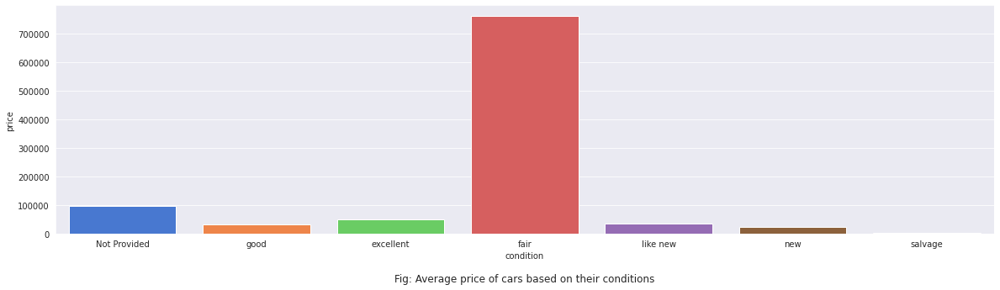

In [32]:
plt.figure(figsize = (20, 5))
sns.barplot(data=df, x="condition", y="price",palette='muted',saturation=10,ci=None)
plt.title('Fig: Average price of cars based on their conditions', y=-0.23)

In [33]:
# Average price of cars listed on each year

df.groupby('year').mean()['price'].sort_values(ascending=True).head(20)

year
1903.0       0.000000
1909.0     750.000000
1901.0    1699.666667
1900.0    3694.166667
1905.0    3990.000000
1944.0    4733.333333
1915.0    5000.000000
1998.0    6833.067404
2001.0    7505.250957
2004.0    7505.399621
1997.0    7643.830626
2005.0    7950.689042
1990.0    8588.173623
1994.0    9007.965909
1995.0    9023.120385
2009.0    9071.532868
1985.0    9130.230277
1926.0    9224.687500
1984.0    9473.356589
2002.0    9582.465187
Name: price, dtype: float64

In [34]:
# Maximum price of car listed in each year

df.groupby('year').max()['price']

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  This is separate from the ipykernel package so we can avoid doing imports until


year
1900.0         38250
1901.0          4000
1902.0       1666666
1903.0             0
1905.0          3990
             ...    
2018.0        299500
2019.0      12345678
2020.0    1111111111
2021.0    3009548743
2022.0       1000000
Name: price, Length: 114, dtype: int64

In [35]:
df.groupby('year').min()['price']

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Dropping invalid columns in DataFrameGroupBy.min is deprecated. In a future version, a TypeError will be raised. Before calling .min, select only columns which should be valid for the function.
  """Entry point for launching an IPython kernel.


year
1900.0          1
1901.0        100
1902.0    1666666
1903.0          0
1905.0       3990
           ...   
2018.0          0
2019.0          0
2020.0          0
2021.0          0
2022.0          0
Name: price, Length: 114, dtype: int64

In [36]:
# Cars were listed in each year
df.groupby('year').count()['model']

year
1900.0       12
1901.0        3
1902.0        1
1903.0       12
1905.0        1
          ...  
2018.0    36153
2019.0    25209
2020.0    19168
2021.0     2383
2022.0      124
Name: model, Length: 114, dtype: int64

In [37]:
# Number of manufacturer's car listed in each year

df.groupby('year').count()['manufacturer']

year
1900.0        5
1901.0        0
1902.0        0
1903.0       12
1905.0        1
          ...  
2018.0    35825
2019.0    24894
2020.0    18917
2021.0     2175
2022.0       92
Name: manufacturer, Length: 114, dtype: int64

In [38]:
df['year'].corr(df['price'])

-0.0049250818935386185

In [39]:
px.scatter(x=df['year'],y=df['price'],title='Scatter plot of price of cars in each year',color_discrete_sequence=['blue'])

In [40]:
# Number of manufacturer's cars listed on Craiglist till today

df['manufacturer'].value_counts().sort_values(ascending=False).head()

ford         70985
chevrolet    55064
toyota       34202
honda        21269
nissan       19067
Name: manufacturer, dtype: int64

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 0.85, "Fig: Number of each manufacturer's listed on Craiglist")

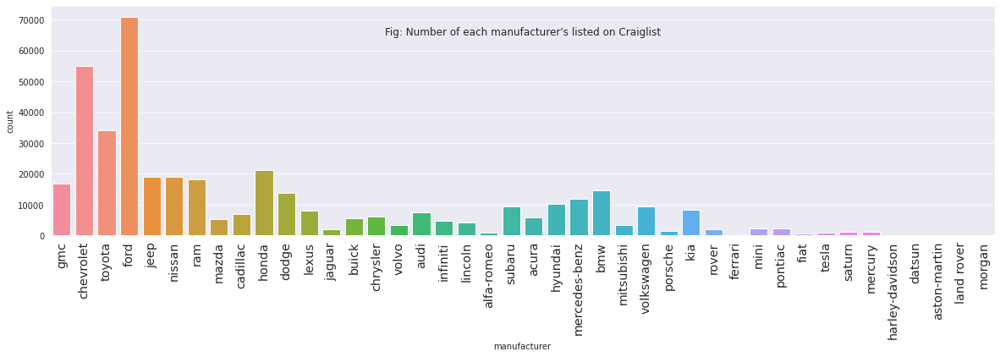

In [41]:
plt.figure(figsize = (20, 5))
sns.countplot(df['manufacturer'],saturation=.9)
plt.xticks(
    rotation=90, 
    horizontalalignment='center',
    fontweight='light',
    fontsize='x-large')
plt.title("Fig: Number of each manufacturer's listed on Craiglist", y=0.85)

In [42]:
df['model'].value_counts().head()

f-150             8009
silverado 1500    5140
1500              4211
camry             3135
silverado         3023
Name: model, dtype: int64

In [43]:
df[df['model']=='f-150']['manufacturer']

228       ford
235       ford
249       ford
337       ford
537       ford
          ... 
426444    ford
426456    ford
426613    ford
426664    ford
426715    ford
Name: manufacturer, Length: 8009, dtype: object

Text(0.5, -0.23, 'Fig: Conditions of cars based on distance traveled')

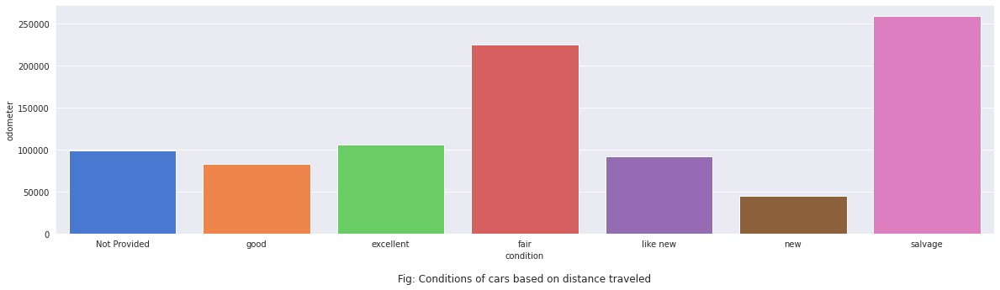

In [44]:
plt.figure(figsize = (20, 5))
sns.barplot(data=df, x="condition", y="odometer",palette='muted',saturation=10,ci=None)
plt.title('Fig: Conditions of cars based on distance traveled', y=-0.23)

In [45]:
# Maximum number of cylinders of the cars of each manufacturer

df.groupby('manufacturer').max()['cylinders']

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning:

Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.



manufacturer
acura               8.0
alfa-romeo          6.0
aston-martin       12.0
audi               12.0
bmw                12.0
buick               8.0
cadillac           12.0
chevrolet          12.0
chrysler           10.0
datsun              6.0
dodge              10.0
ferrari            12.0
fiat                4.0
ford               12.0
gmc                12.0
harley-davidson     8.0
honda              10.0
hyundai            10.0
infiniti           10.0
jaguar             12.0
jeep               10.0
kia                 8.0
land rover          8.0
lexus              10.0
lincoln            12.0
mazda              10.0
mercedes-benz      12.0
mercury             8.0
mini                8.0
mitsubishi         10.0
morgan              4.0
nissan             10.0
pontiac             8.0
porsche            10.0
ram                12.0
rover              10.0
saturn              8.0
subaru              8.0
tesla              10.0
toyota             10.0
volkswagen         10.0
vol

In [46]:
px.histogram(df, x='cylinders',color_discrete_sequence = ['#c21313'],nbins=10,title='Number of cars in each cateory of cylinder number')

In [47]:
# Average price of cars based on cylinders

df.groupby('cylinders').mean()['price'].sort_values(ascending=False)

cylinders
8.0     139595.722142
6.0      58696.317058
12.0     54299.382775
10.0     21507.802062
3.0      12296.996947
4.0      10545.301370
5.0       7842.779790
Name: price, dtype: float64

In [48]:
fig = px.box(df, y="cylinders",color_discrete_sequence = ['red'],title='Boxplot of distributions of cylinders')
fig.update_traces(orientation='h')
fig.show()

In [49]:
# Average prices beween different fueled cars

df.groupby('fuel').mean()['price'].sort_values(ascending=False)

fuel
diesel      118177.693467
gas          73902.259659
other        66811.403899
electric     24648.362191
hybrid       14582.430948
Name: price, dtype: float64

In [50]:
df['fuel'].value_counts()

gas         356209
other        30728
diesel       30062
hybrid        5170
electric      1698
Name: fuel, dtype: int64

In [51]:
# Average distance traveled by each fuel type car

df.groupby('fuel').mean()['odometer'].sort_values(ascending=False)

fuel
diesel      136806.058700
gas          98647.212082
hybrid       89542.996506
other        58698.424356
electric     39913.098641
Name: odometer, dtype: float64

In [52]:
# Average distance traveled by each manufacturer's car

df.groupby('manufacturer').mean()['odometer'].sort_values()

manufacturer
morgan              14377.666667
aston-martin        22353.958333
ferrari             29732.589474
alfa-romeo          34668.399103
tesla               37385.431871
jaguar              50949.679031
fiat                52572.235443
harley-davidson     57768.254902
audi                66060.754915
mini                67154.336993
mitsubishi          69606.298780
land rover          71202.571429
lincoln             73327.873266
datsun              73693.349206
rover               74006.592752
infiniti            74418.063063
bmw                 76193.385926
acura               77527.153924
kia                 78001.762931
cadillac            79680.888808
mercedes-benz       80286.609401
porsche             82525.242182
volkswagen          83933.527886
hyundai             86956.791059
jeep                87511.432497
mazda               89466.268565
dodge               90408.904031
lexus               90820.043532
nissan              91775.185408
ram                 97604.8227

In [53]:
# Car models which covered the most distance 

df.groupby('model').max()['odometer'].sort_values(ascending=False).head()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning:

Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.



model
914          10000000.0
Trade ins    10000000.0
.            10000000.0
rx 330       10000000.0
monza 2+2    10000000.0
Name: odometer, dtype: float64

In [54]:
# Correlation coefficient between odometer(distance traveled) and price

df['odometer'].corr(df['price'])

0.010032266733226193

In [55]:
df['title_status'].value_counts()

clean         405117
rebuilt         7219
salvage         3868
lien            1422
missing          814
parts only       198
Name: title_status, dtype: int64

In [56]:
# Number of cars listed which has Vehicle Identification Number(VIN)
 
df['VIN'].count()

265838

In [57]:
# Average price of each car type

df.groupby('type').mean()['price'].sort_values(ascending=False)

type
pickup         144751.639554
SUV             34434.047552
truck           29383.577993
other           24743.587517
coupe           21937.563424
convertible     19999.774285
van             17487.596748
sedan           15950.185076
offroad         15813.093596
hatchback       14384.513375
bus             14105.617021
wagon           13273.909683
mini-van         9234.087668
Name: price, dtype: float64

In [58]:
# Maximum number of cylinders of each car type 

df.groupby('type').max()['cylinders'].sort_values(ascending=False)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning:

Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.



type
SUV            12.0
convertible    12.0
coupe          12.0
other          12.0
pickup         12.0
sedan          12.0
truck          12.0
bus            10.0
hatchback      10.0
offroad        10.0
van            10.0
wagon          10.0
mini-van        8.0
Name: cylinders, dtype: float64

In [59]:
df['paint_color'].value_counts()

white     79285
black     62861
silver    42970
blue      31223
red       30473
grey      24416
green      7343
custom     6700
brown      6593
yellow     2142
orange     1984
purple      687
Name: paint_color, dtype: int64

In [60]:
px.histogram(df, x='paint_color',color_discrete_sequence = ['#802525'],title='Number of cars of each color')

In [61]:

car_colors = ['white','black','silver','blue','red','grey','green','custom','brown','yellow','orange','purple']
val_counts = [79285,62861,42970,31223,30473,24416,7343,6700,6593,2142,1984,687]
fig = px.pie(values=val_counts,names=car_colors,color=car_colors,color_discrete_map={
    'white':'blue',
    'black':'cyan',
    'silver':'#dddddd',
    'blue':' #005b96',
    'red':'#ee4035',
    'grey':'#aaaaaa',
    'green':'#7bc043',
    'custom':'#65c3ba',
    'brown':'#4f372d',
    'yellow':'#ffc425',
    'orange':'#f37735',
    'purple':'#2e003e'
},
title = 'Fig: Representaion of percentage of colors'
             )
fig.show()

In [62]:
# Converting object datatype to datetime

df['posting_date'] =  pd.to_datetime(df['posting_date'],utc=True)

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, -0.23, 'Fig: Distribution of cars listed of every hour')

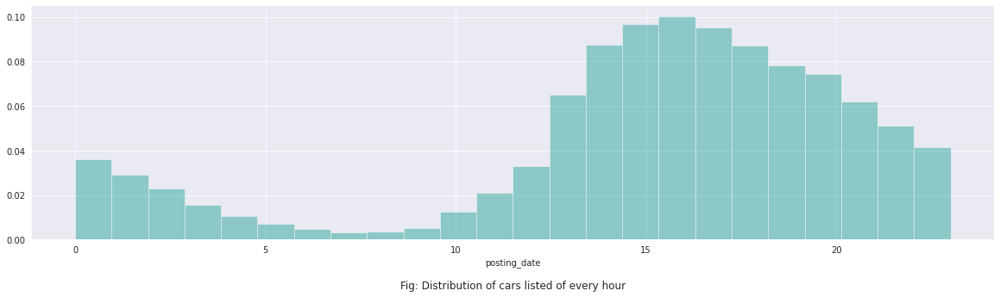

In [63]:
plt.figure(figsize = (20, 5))
sns.distplot(df['posting_date'].dt.hour,bins=24,kde=False,norm_hist=True,color='#009688')
plt.title('Fig: Distribution of cars listed of every hour', y=-0.23)

'\nMonday- 0\nTuesday- 1\nWednesday- 2\nThursday- 3\nFriday- 4\nSaturday- 5\nSunday- 6\n'

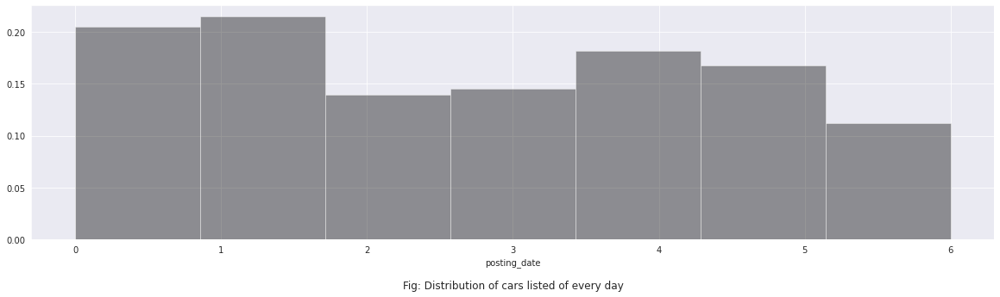

In [64]:
plt.figure(figsize = (20, 5))
sns.distplot(df['posting_date'].dt.dayofweek,bins=7,kde=False,norm_hist=True,color='black')
plt.title('Fig: Distribution of cars listed of every day', y=-0.23)

'''
Monday- 0
Tuesday- 1
Wednesday- 2
Thursday- 3
Friday- 4
Saturday- 5
Sunday- 6
'''

In [65]:
# Latitude

df['lat']

0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
426875    33.786500
426876    33.786500
426877    33.779214
426878    33.786500
426879    33.779214
Name: lat, Length: 426880, dtype: float64

In [66]:
# Longitude 

df['long']

0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
426875   -84.445400
426876   -84.445400
426877   -84.411811
426878   -84.445400
426879   -84.411811
Name: long, Length: 426880, dtype: float64

Text(0.5, -0.23, 'Fig: Latitude and Longitude of each state')

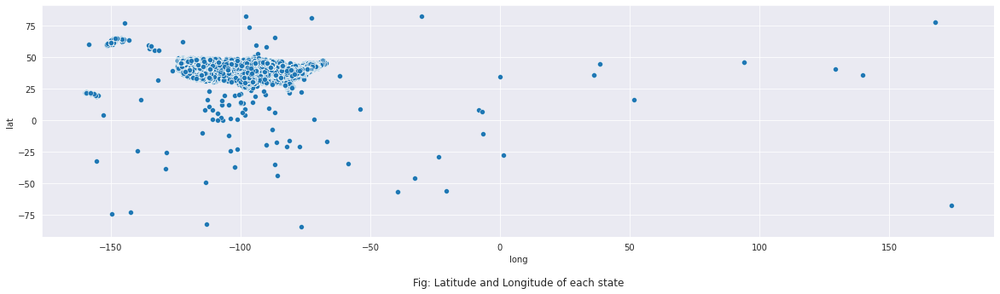

In [67]:
plt.figure(figsize = (20, 5))
sns.scatterplot(x=df['long'],y=df['lat'])
plt.title('Fig: Latitude and Longitude of each state', y=-0.23)

In [68]:
import folium
from folium.plugins import HeatMap
from folium import plugins
from folium.plugins import HeatMap

In [69]:
sample_df = df.sample(int(0.01*len(df)))
lat_long_pairs = list(zip(list(df['lat']),list(df['long'])))

In [70]:
map=folium.Map()
HeatMap(lat_long_pairs[50:150]).add_to(map)
map

In [71]:
# Count of cars listed from each state of USA

df.groupby('state').count()['model'].sort_values(ascending=False).head()

state
ca    49995
fl    28155
tx    22635
ny    19164
oh    17477
Name: model, dtype: int64

In [72]:
# Questions and answers

# # **From which region the car sell offers are listed the most?**
# - By analysing the data, we can see that the people of Columbus are slightly more likely to sell cars than the other regions.The very next city is Jacksonville.The difference between the cars listed from Columbus and Jacksonville quite small.The reason behind this could be both Columbus and Jacksonville are populated city and population differnce isn't also considerably large.
# But the most important thing to notice that the people of the city of Spoken and Eugene are more likely to list their cars on Craiglist. From the data of 2021,though the poplation of this cities is less than one-fourth of the previous two cities but number of listed cars are pretty less dispersed.

# # **From which region of USA Mercedes-Benz are listed more on Craiglist?**
# - New york.

# # **Do car's price depend on it's current condition or it's just the brand name that matters?**
# - People are more likely to list their cars of preety fair conditions in a satisfactory prices.Cars of any particular brand doesn't effect the listing price that much. If the condition of the car is fair enough it is good to go.

# # **List the name of top 5 manufacturers whose highest number of cars are listed?**
#  - The names are Ford,Chevrolet,Toyota,Honda and Nissan respectively.

# # **Provide the name of the manufacturers who's 12 cylinders cars are listed?**
#  - Aston-Martin,Audi,BMW,Cadillac,Chevrolet,Ferrari,Ford,GMC,Jaguar,Lincoln,Mercedes-Benz,Ram,Volvo.

# # **Sort engines based on average price from highest to lowest(descending order)**
#  - 8 cylinders,6 cylinders,12 cylinders,10 cylinders,3 cylinders,4 cylinders,5 cylinders.

# # **Compare the average prices between differnt fuels and sort them from cheapest to most expensive categories.**
#  - In Craiglist,
# Average price of Diesel cars is    118177.693467 USD, 
# Average price of gas cars is       73902.259659 USD,
# Average price of electric cars is   24648.362191 USD,
# Average price of hybrid cars is    14582.430948 USD
# Comparing this averages prices, we can conclude the order would be Hybrid,Electric,Gas,Diesel cars.

# # **Which type of cars are more listed on Craiglist till today?**
#  - Gas cars. The main reasons behind this can be the concept of gas cars is continuing for so many years and it is cheaper and convinient than the diesel cars. Besides electric cars are much recent so this is obvious that the number of electric cars are far less than gas and others.
 
# # **What is the average odometer readings for electric cars?**
#   - 39913.098641 Kms

# # **Name 3 car models which covered the most distances.**
#   - Monza 2+2, Porsche 914, RX 330

# # **How many cars there are in which are bought by taking loans from lender listed in Craiglist?**
#   - 1422 cars

# # **what is the highest number of cylinders the Wagon have?**
#   - 10 cylinders

# # **Name 5 state fromm where maximum number of cars are listed?**
#   - California,Florida,Texas,New York,Ohio




In [73]:
# INSIGHTS
# ------------------
# - Price and cylinders are positively correlated. That means the increasing number of cylinders tends to increase price.
# - The model named 4runner, which is manufactured by Toyota has the highest price.
# - Mercedes-Benz has the highest average price among the listed cars.
# - The cars listed on Craiglist are mostly of good conditions.
# - Cars which are fair conditioned has more average price compared to good,excellent,like new etc. conditions.
# - From the data we are given and since this is data of used car,we can conclude that price actually isn't increasing every year rather it is fluctuating unlike the new car industry where price seems to increase every year and so.
# - People listed Ford cars on Craiglist the maximum number of times.
# - The model named f-150, which is manufactured by Ford is highest listed car. 
# - Odometer is an instrument for measuring the distance travelled by a wheeled vehicle. By analyzing the odometer readings we can establish a relation between that distance and the condition of the car that the more the reading of odometer, the degraded the condition of that car. For example, cars which are listed as salvage has higher readings(More distance travelled) on odometer.
# - The cars listed on Craiglist are more of 6 cylinders.
# - The average price of 8 cylinder cars are more than others.
# - The cars listed on Craiglist are mostly gas cars.
# - On average,Diesel cars are the most expensive cars between the other categories listed. 
# - Diesel cars has traveled the highest distance on average among other cars.
# - On average, Manufacturer Morgan's car has traveled the lowest distance and Pontiac's car has traveled the highest distance.
# - Pick up's are the most expensive car types on average.
# - Offroad's covered the highest distance on average among the other cars.
# - The maximum number of cars are of white color.
# - Between 3 AM to 5 AM, maximum number of cars are listed.
# (USA have six time zones though)
# - People are more likely to list their cars on Craiglist on Monday and Tuesday than the other days of the week.
# - Maximum number of cars are listed from 'ca'(California)


 


**This is my first kernel. An UPVOTE will be much inspiring for me if you liked this
. As a beginner,any kind of suggestion will be much appreciated for me to improve 😊**